<a href="https://colab.research.google.com/github/mohamed7456/BlindRoomNavigator/blob/main/model_notebook/fine_tune_yolov8n_doors.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Loading Combined Datasets**

In [ ]:
from google.colab import files
files.upload()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Fine Tune Yolo**

In [ ]:
!pip install ultralytics --quiet
from ultralytics import YOLO

In [ ]:
# create yaml file
dataset_yaml = """
train: /content/drive/MyDrive/Combined_Dataset_adjusted/train
val: /content/drive/MyDrive/Combined_Dataset_adjusted/val
nc: 1
names: ['door']
"""

with open('doors_dataset.yaml', 'w') as f:
    f.write(dataset_yaml)

In [ ]:
model = YOLO('yolov8n.pt')

results = model.train(
    data='doors_dataset.yaml',
    epochs=65,
    imgsz=640,
    batch=16,
    name='doors_detection_refined',
    patience=20,
    degrees=3.0,
    translate=0.02,
    scale=0.1,
    shear=0.0,
    perspective=0.0,
    fliplr=0.2,
    hsv_h=0.01,
    hsv_s=0.2,
    hsv_v=0.1
)

model.val()

# **Evaluate the Model**

In [ ]:
results = model.val()

Ultralytics 8.3.134 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.5±0.4 ms, read: 6.8±1.5 MB/s, size: 14.9 KB)


val: Scanning /content/drive/.shortcut-targets-by-id/1Iw3z8l_tOuAnwHeN0mdVZh2nhW3uU34A/Combined_Dataset_adjusted/val/labels.cache... 544 images, 71 backgrounds, 0 corrupt: 100%|██████████| 544/544 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:12<00:00,  2.75it/s]


                   all        544        538      0.974      0.913      0.964      0.868
Speed: 1.3ms preprocess, 4.7ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/doors_detection_refined3



0: 640x640 1 door, 4.8ms
1: 640x640 2 doors, 4.8ms
2: 640x640 1 door, 4.8ms
3: 640x640 2 doors, 4.8ms
4: 640x640 1 door, 4.8ms
5: 640x640 1 door, 4.8ms
6: 640x640 1 door, 4.8ms
7: 640x640 1 door, 4.8ms
8: 640x640 (no detections), 4.8ms
9: 640x640 (no detections), 4.8ms
10: 640x640 1 door, 4.8ms
11: 640x640 2 doors, 4.8ms
12: 640x640 1 door, 4.8ms
13: 640x640 1 door, 4.8ms
14: 640x640 2 doors, 4.8ms
15: 640x640 1 door, 4.8ms
16: 640x640 1 door, 4.8ms
17: 640x640 1 door, 4.8ms
18: 640x640 1 door, 4.8ms
19: 640x640 (no detections), 4.8ms
Speed: 3.7ms preprocess, 4.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


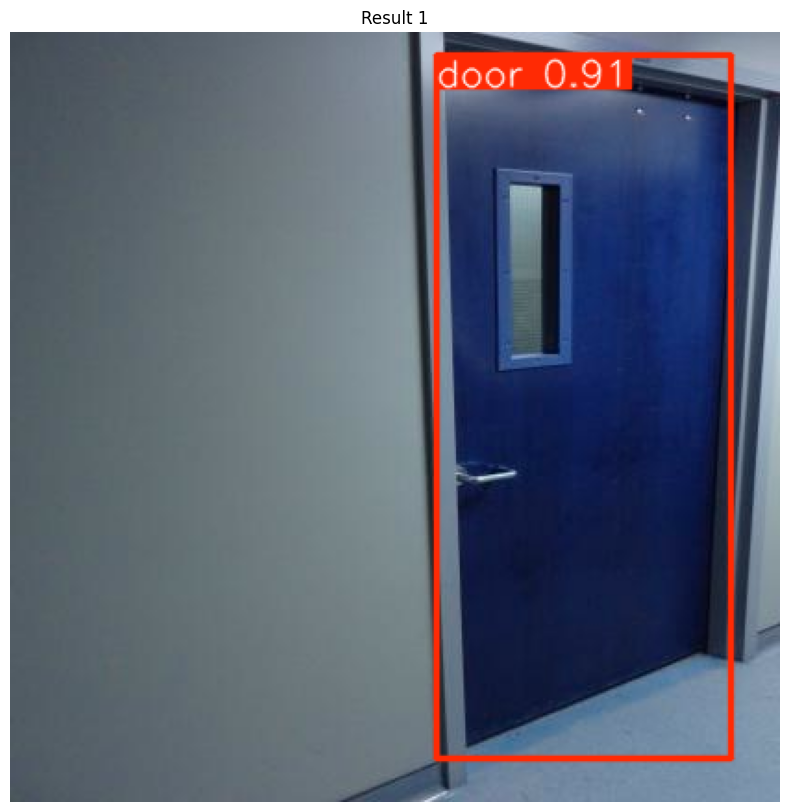

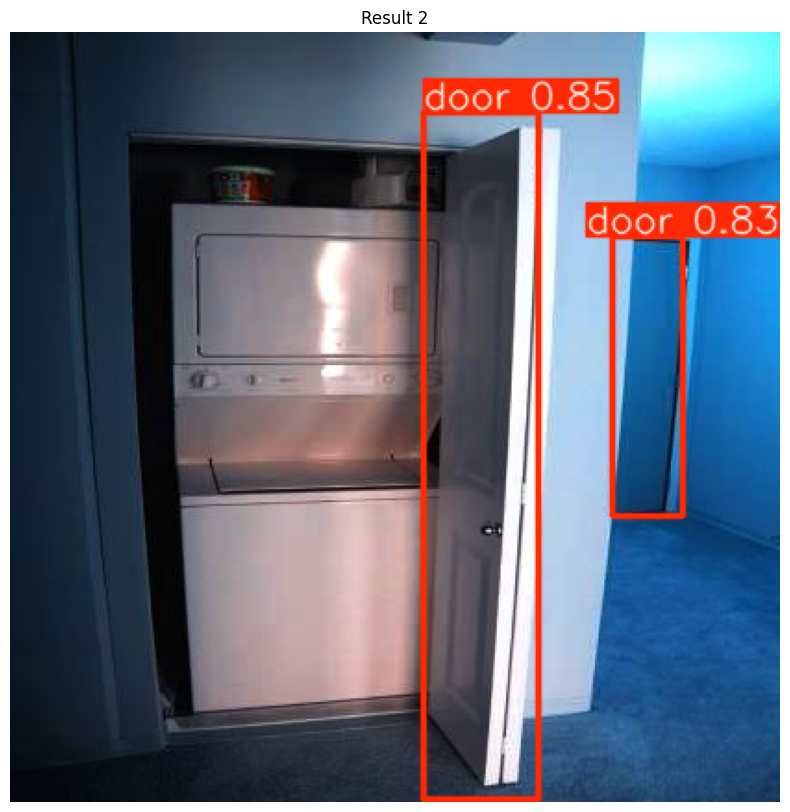

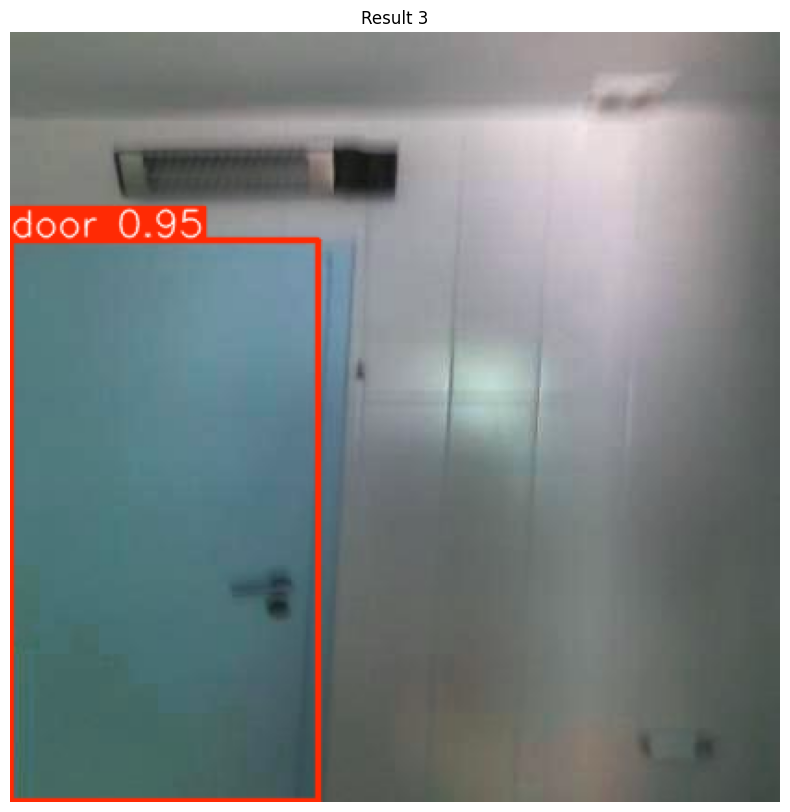

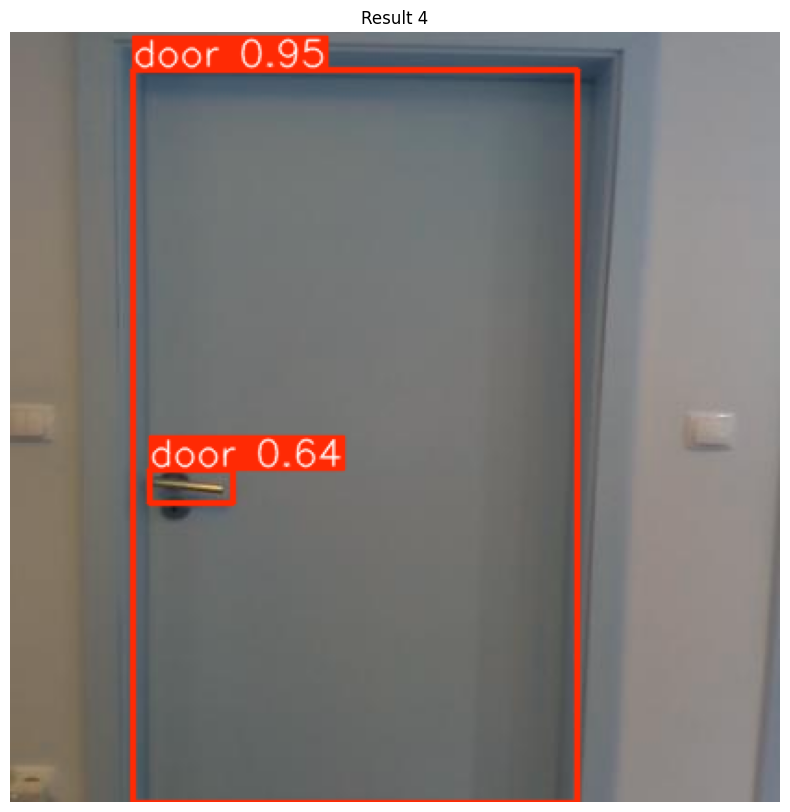

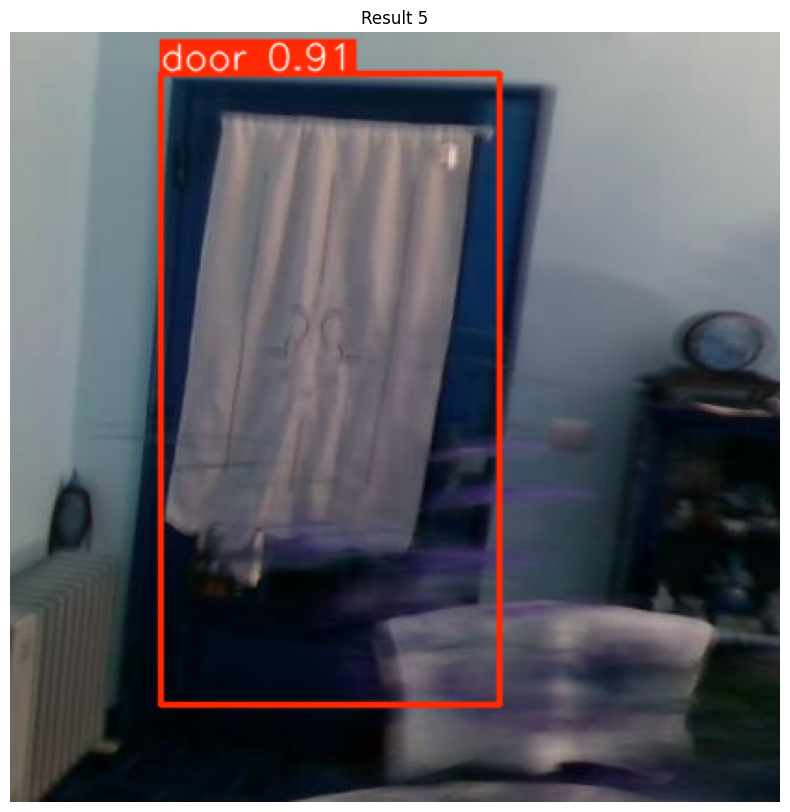

...

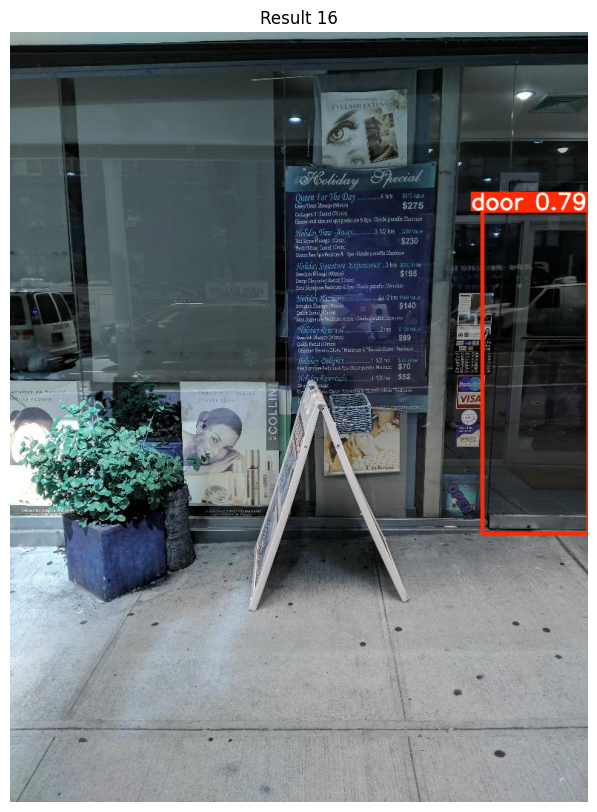

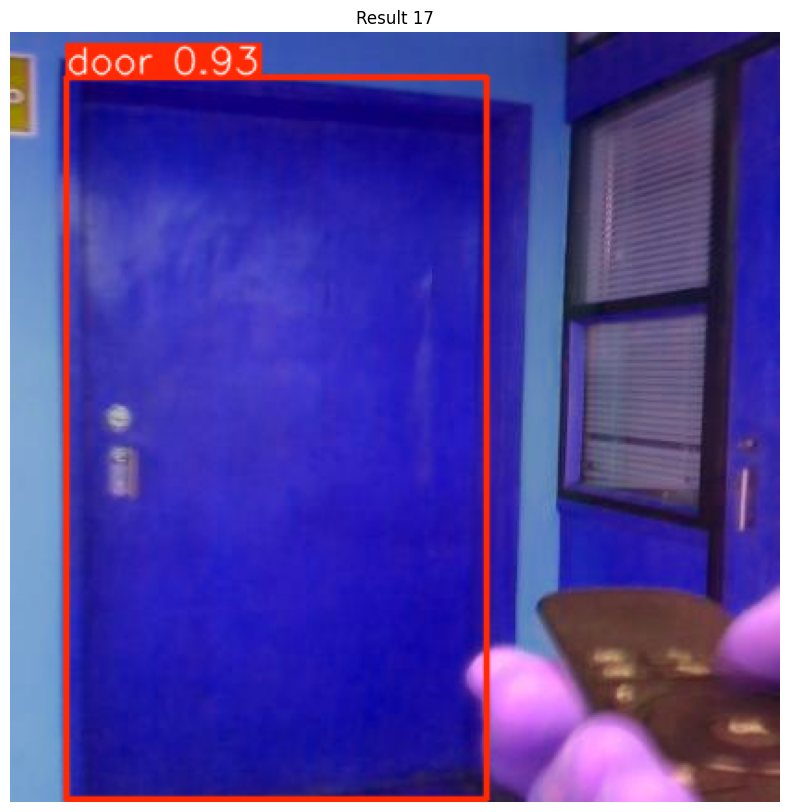

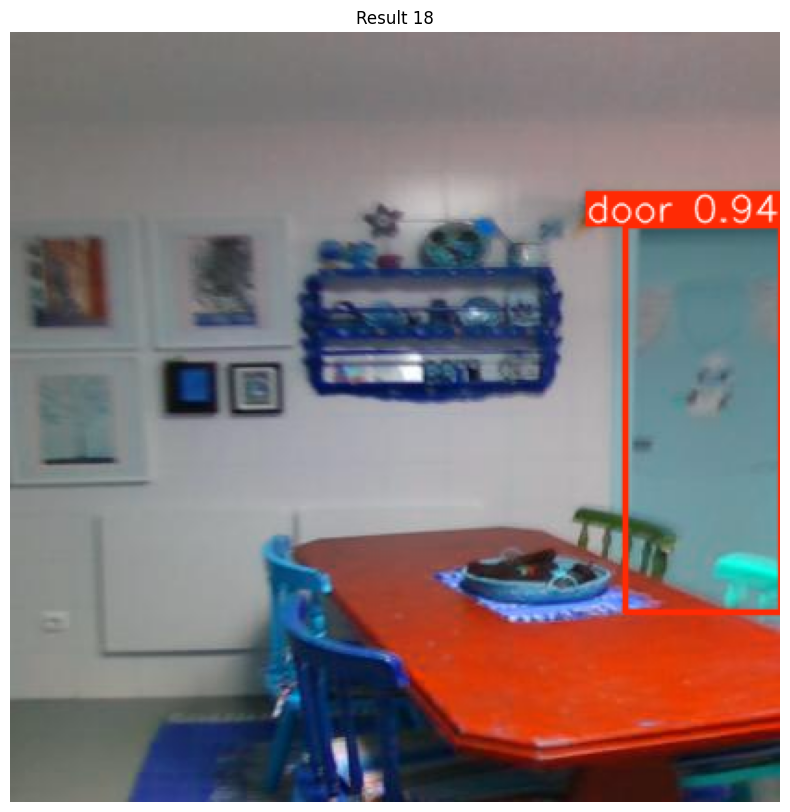

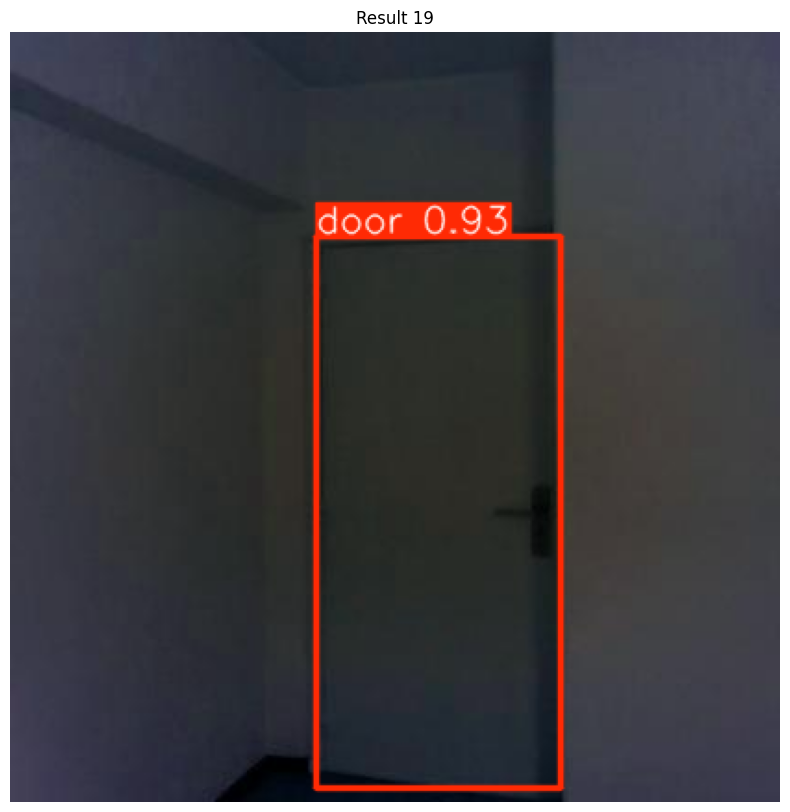

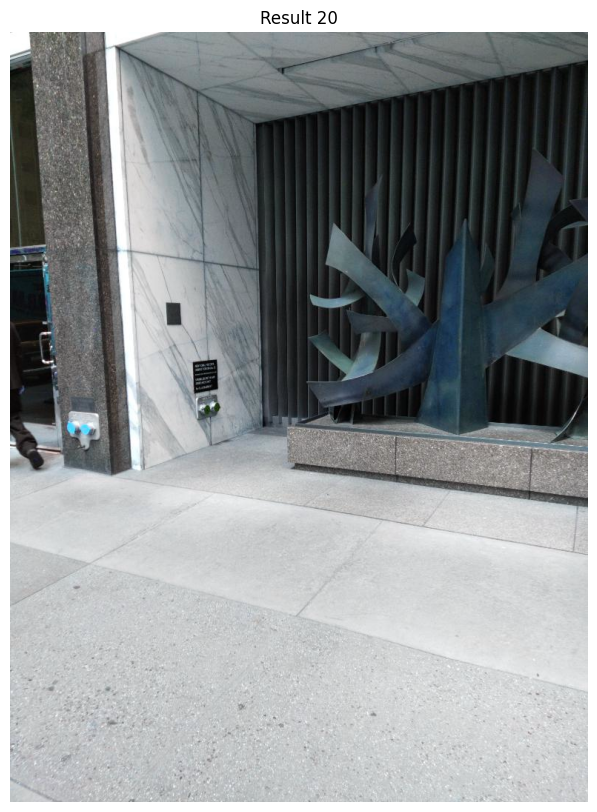

In [ ]:
import os
import matplotlib.pyplot as plt

results = model([os.path.join('/content/drive/MyDrive/Combined_Dataset_adjusted/val/images', image_file)
                 for image_file in os.listdir('/content/drive/MyDrive/Combined_Dataset_adjusted/val/images')][:20])

for i, result in enumerate(results):
    img_with_boxes = result.plot()
    plt.figure(figsize=(10, 10))
    plt.imshow(img_with_boxes)  # Display the image with boxes
    plt.axis('off')
    plt.title(f"Result {i + 1}")
    plt.show()

In [ ]:
# test
results = model('/content/myroom.jpg', save=True)

In [ ]:
results = model('/content/r5.jpg', save=True)

In [ ]:
!ls -lh /content/runs/detect/

In [ ]:
!zip -r /content/runs_detect_doors_detection_refined.zip /content/runs/detect/doors_detection_refined

In [ ]:
from google.colab import files
files.download('/content/runs_detect_doors_detection_refined.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Export**

In [ ]:
from ultralytics import YOLO
model = YOLO('runs/detect/doors_detection_refined/weights/best.pt')

In [ ]:
!yolo export model=runs/detect/doors_detection_refined/weights/best.pt format=tflite